<a href="https://colab.research.google.com/github/A-tavv/human-data-analytics/blob/main/human_data_analytics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Google Drive**

In [ ]:
# Mounting Google Drive in Google Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Import Libraries**

In [ ]:
# Data Manipulation and Analysis
import numpy as np
import pandas as pd

# Machine Learning and Deep Learning
import tensorflow as tf
from keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dense, Flatten
from keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras import Sequential
from keras.metrics import mean_absolute_error
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.xception import preprocess_input
from keras.applications import MobileNet, InceptionV3

# Date and Time Manipulation
import datetime

# File and Directory Operations
import os

# Mathematical Operations
import math

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

# Machine Learning Model Evaluation
from sklearn.model_selection import train_test_split

# **Preprocessing**

In [ ]:
# Read CSV files

# Read the training CSV file into a DataFrame
train_df = pd.read_csv('/content/drive/MyDrive/Farman Project/Bone Age Training Set/train.csv')

# Read the testing CSV file into a DataFrame
test_df = pd.read_csv('/content/drive/MyDrive/Farman Project/Bone Age Test Set/Bone age ground truth.csv')


In [ ]:
# Appending file extension to 'id' column for both training and testing dataframes

# For the training dataframe
train_df['id'] = train_df['id'].apply(lambda x: str(x) + '.png')

# For the testing dataframe
test_df['Case ID'] = test_df['Case ID'].apply(lambda x: str(x) + '.png')

In [ ]:
# Show 5 top row of train DataFrame
train_df.head()

,id,boneage,male
0,1377.png,180,False
1,1378.png,12,False
2,1379.png,94,False
3,1380.png,120,True
4,1381.png,82,False


In [ ]:
# Show 5 top row of test DataFrame
test_df.head()

,Case ID,Sex,Ground truth bone age (months)
0,4360.png,M,168.93
1,4361.png,M,169.65
2,4362.png,M,73.26
3,4363.png,M,152.86
4,4364.png,M,135.46


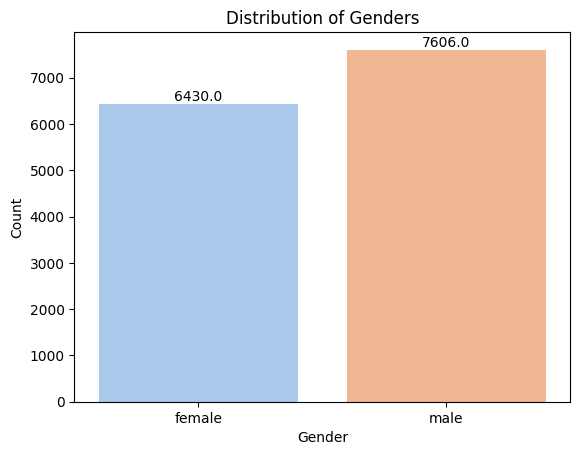

In [ ]:
# Creating a new column called gender to keep the gender of the child as a string
train_df['gender'] = train_df['male'].apply(lambda x: 'male' if x else 'female')

# Plotting a countplot to visualize the distribution of genders
g = sns.countplot(x=train_df['gender'], palette='pastel')

# Add labels with the count of each category
for p in g.patches:
    g.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

# Set the plot title and axis labels
plt.title('Distribution of Genders')
plt.xlabel('Gender')
plt.ylabel('Count')

# Show the plot
plt.show()

In [ ]:
# Create a list to store the rows
rows = []

# Oldest child in the dataset
max_age = train_df['boneage'].max()
rows.append({'Statistic': 'MAX age', 'Value': f'{max_age} months'})

# Youngest child in the dataset
min_age = train_df['boneage'].min()
rows.append({'Statistic': 'MIN age', 'Value': f'{min_age} months'})

# Mean age
mean_bone_age = train_df['boneage'].mean()
rows.append({'Statistic': 'Mean age', 'Value': f'{mean_bone_age}'})

# Median bone age
median_age = train_df['boneage'].median()
rows.append({'Statistic': 'Median age', 'Value': f'{median_age}'})

# Standard deviation of bone age
std_bone_age = train_df['boneage'].std()
rows.append({'Statistic': 'Standard Deviation', 'Value': f'{std_bone_age}'})

# Create the result DataFrame by concatenating the rows
result_df = pd.concat([pd.DataFrame(row, index=[0]) for row in rows], ignore_index=True)

# Show the result DataFrame
result_df.head()

,Statistic,Value
0,MAX age,228 months
1,MIN age,1 months
2,Mean age,127.30407523510972
3,Median age,132.0
4,Standard Deviation,41.23569606097143


In [ ]:
# Calculate the z scores for the bone ages in the training DataFrame
train_df['bone_age_z'] = (train_df['boneage'] - mean_bone_age) / std_bone_age

# Display the updated DataFrame
train_df.head()

,id,boneage,male,gender,bone_age_z
0,1377.png,180,False,female,1.277920
1,1378.png,12,False,female,-2.796220
2,1379.png,94,False,female,-0.807652
3,1380.png,120,True,male,-0.177130
4,1381.png,82,False,female,-1.098662


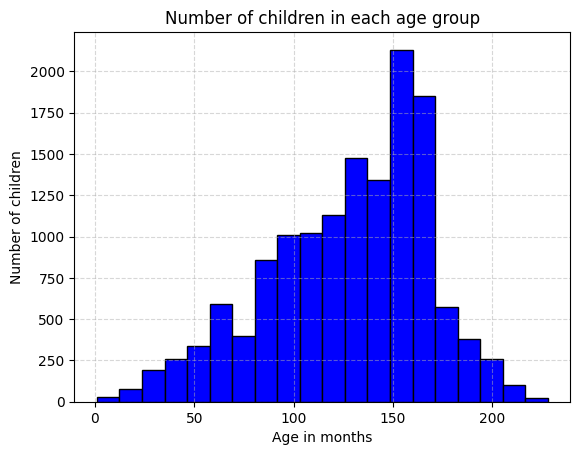

In [ ]:
# Plotting a histogram for bone ages

# Plot a histogram of bone ages
plt.hist(train_df['boneage'], bins=20, color='blue', edgecolor='black')

# Set x-axis and y-axis labels
plt.xlabel('Age in months')
plt.ylabel('Number of children')

# Set the title of the plot
plt.title('Number of children in each age group')

# Add gridlines to the plot
plt.grid(True, linestyle='--', alpha=0.5)

# Show the plot
plt.show()

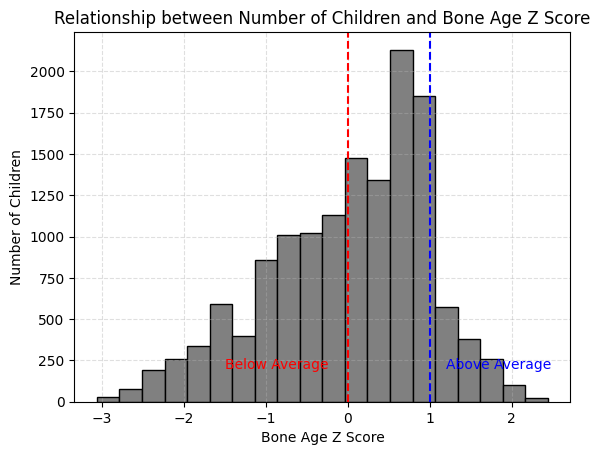

In [ ]:
# Relationship between the number of children and bone age z score

# Plot a histogram of bone age z scores
plt.hist(train_df['bone_age_z'], bins=20, color='gray', edgecolor='black')

# Set x-axis and y-axis labels
plt.xlabel('Bone Age Z Score')
plt.ylabel('Number of Children')

# Set the title of the plot
plt.title('Relationship between Number of Children and Bone Age Z Score')

# Add gridlines to the plot
plt.grid(True, linestyle='--', alpha=0.4)

# Add vertical lines for reference
plt.axvline(0, color='red', linestyle='--', linewidth=1.5)
plt.axvline(1, color='blue', linestyle='--', linewidth=1.5)

# Add text labels for the vertical lines
plt.text(-1.5, 200, 'Below Average', color='red')
plt.text(1.2, 200, 'Above Average', color='blue')

# Show the plot
plt.show()

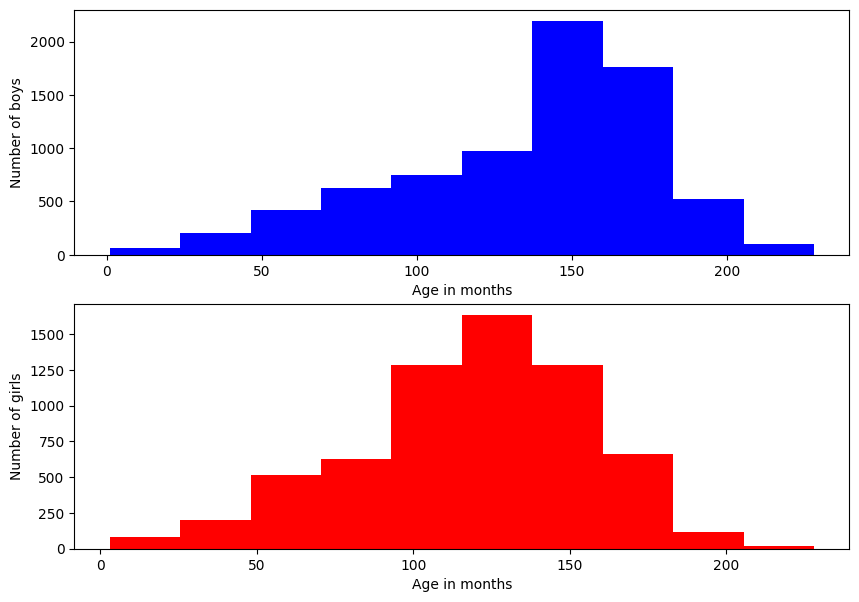

In [ ]:
# Distribution of age within each gender

# Filter the train_df DataFrame to separate male and female samples
male = train_df[train_df['gender'] == 'male']
female = train_df[train_df['gender'] == 'female']

# Create a figure with two subplots
fig, ax = plt.subplots(2, 1)

# Plot a histogram of bone age distribution for males
ax[0].hist(male['boneage'], color='blue')
ax[0].set_xlabel('Age in months')
ax[0].set_ylabel('Number of boys')

# Plot a histogram of bone age distribution for females
ax[1].hist(female['boneage'], color='red')
ax[1].set_xlabel('Age in months')
ax[1].set_ylabel('Number of girls')

# Set the figure size
fig.set_size_inches((10, 7))

# Display the figure with the histograms
plt.show()

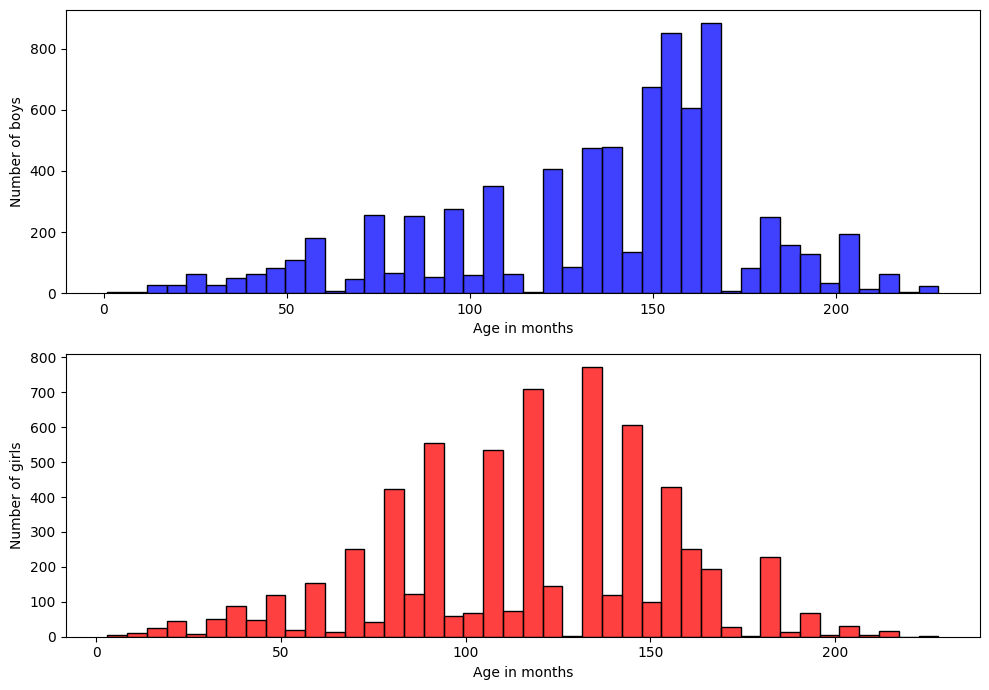

In [ ]:
# Distribution of age within each gender

# Filter the train_df DataFrame to separate male and female samples
male = train_df[train_df['gender'] == 'male']
female = train_df[train_df['gender'] == 'female']

# Create a figure with two subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 7))

# Plot a histogram of bone age distribution for males
sns.histplot(data=male, x='boneage', color='blue', edgecolor='black', ax=ax[0])
ax[0].set_xlabel('Age in months')
ax[0].set_ylabel('Number of boys')

# Plot a histogram of bone age distribution for females
sns.histplot(data=female, x='boneage', color='red', edgecolor='black', ax=ax[1])
ax[1].set_xlabel('Age in months')
ax[1].set_ylabel('Number of girls')

# Adjust the layout of subplots to prevent overlap
fig.tight_layout()

# Display the figure with the histograms
plt.show()

# **get ready for build mode**

In [ ]:
# Splitting train DataFrame into training and validation DataFrames
df_train, df_valid = train_test_split(train_df,  test_size = 0.1, random_state = 0)

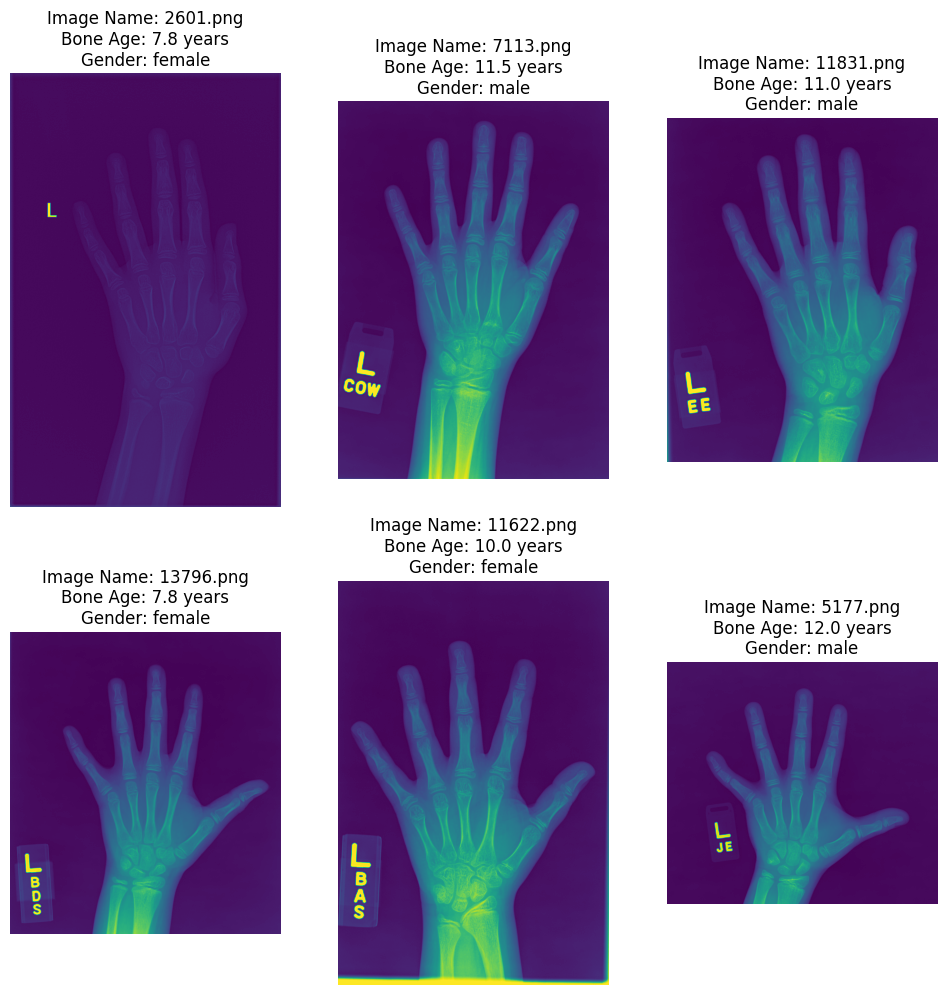

In [ ]:
# Create a figure with subplots to display sample images
fig, axes = plt.subplots(2, 3, figsize=(10, 10))
fig.tight_layout()

# Iterate over a sample of image filenames, bone ages, and genders from the train_df DataFrame
for i, (filename, boneage, gender) in enumerate(train_df[['id', 'boneage', 'gender']].sample(6).values):
    # Read the image using mpimg.imread
    img = mpimg.imread('/content/drive/MyDrive/Farman Project/Bone Age Training Set/boneage-training-dataset/' + filename)

    # Determine the row and column for placing the image in the subplot grid
    row = i // 3
    col = i % 3

    # Display the image in the corresponding subplot
    axes[row, col].imshow(img)
    axes[row, col].set_title('Image Name: {}\nBone Age: {:.1f} years\nGender: {}'.format(filename, boneage / 12, gender))
    axes[row, col].axis('off')

# Show the figure with sample images
plt.show()

In [ ]:
# Set the image size
img_size = 224

In [ ]:
# Train data generator
print("Creating train data generator...")

# Create an ImageDataGenerator for train data
train_data_generator = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True
)

# Generate train data from the DataFrame using flow_from_dataframe
train_generator = train_data_generator.flow_from_dataframe(
    dataframe=df_train,
    directory='/content/drive/MyDrive/Farman Project/Bone Age Training Set/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode='other',
    color_mode='rgb',
    target_size=(img_size, img_size)
)

Creating train data generator...
Found 12632 validated image filenames.


In [ ]:
# Validation data generator
print("\nCreating validation data generator...")

# Create an ImageDataGenerator for validation data
val_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

# Generate validation data from the DataFrame using flow_from_dataframe
val_generator = val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/content/drive/MyDrive/Farman Project/Bone Age Training Set/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode='other',
    color_mode='rgb',
    target_size=(img_size, img_size)
)


Creating validation data generator...
Found 1404 validated image filenames.


In [ ]:
# Test data generator
print("\nCreating test data generator...")

# Create an ImageDataGenerator for test data
test_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

# Generate test data from a directory using flow_from_directory
test_generator = test_data_generator.flow_from_directory(
    directory='/content/drive/MyDrive/Farman Project/Bone Age Test Set',
    shuffle=True,
    class_mode=None,
    color_mode='rgb',
    target_size=(img_size, img_size)
)


Creating test data generator...
Found 200 images belonging to 1 classes.


In [ ]:
# Load and prepare validation data
print("Loading val data...")

# Load the validation data using flow_from_dataframe method
test_X, test_Y = next(test_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/content/drive/MyDrive/Farman Project/Bone Age Training Set/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    shuffle=False,  # Disable shuffling to maintain the order of validation data
    class_mode='other',
    color_mode='rgb',
    target_size=(img_size, img_size),
    batch_size=1404
))

# Print the shape of the validation data
print("\nValidation data shape:", test_X.shape)

Loading val data...
Found 1404 validated image filenames.

Validation data shape: (1404, 224, 224, 3)


In [ ]:
# Function to plot training and validation error
def plot_it(history):
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plot the training error (MAE)
    ax.plot(history.history['mae_in_months'])

    # Plot the validation error (MAE)
    ax.plot(history.history['val_mae_in_months'])

    plt.title('Model Error')
    plt.ylabel('Error')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper right')
    ax.grid(color='black')
    plt.show()

In [ ]:
# Function to calculate mean absolute error (MAE) in months

def mae_in_months(x_p, y_p):
    return mean_absolute_error((std_bone_age*x_p + mean_bone_age), (std_bone_age*y_p + mean_bone_age))

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Specify the directory path for TensorBoard logs
logs_dir = '.\logs'

# Start TensorBoard server and visualize logs in the specified directory
%tensorboard --logdir {logs_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 8890), started 0:46:41 ago. (Use '!kill 8890' to kill it.)

<IPython.core.display.Javascript object>

# **my build**

In [ ]:
# Define the base Xception model with pre-trained weights
model_1 = tf.keras.applications.xception.Xception(input_shape=(img_size, img_size, 3),
                                                  include_top=False,
                                                  weights='imagenet')

# Set the Xception model to be trainable
model_1.trainable = True

# Create a sequential model (model_2)
model_2 = Sequential()

# Add the Xception base model as the first layer in model_2
model_2.add(model_1)

# Add a global max pooling layer to reduce spatial dimensions
model_2.add(GlobalMaxPooling2D())

# Flatten the tensor output from the previous layer
model_2.add(Flatten())

# Add a dense layer with 10 units and ReLU activation
model_2.add(Dense(10, activation='relu'))

# Add a dense layer with 1 unit and linear activation for regression
model_2.add(Dense(1, activation='linear'))

# Compile the model with mean squared error (MSE) loss and Adam optimizer
model_2.compile(loss='mse', optimizer='adam', metrics=[mae_in_months])

# Print a summary of the model architecture
model_2.summary()

83683744/83683744 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_max_pooling2d (Globa  (None, 2048)             0         
 lMaxPooling2D)                                                  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 10)                20490     
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 20,881,981
Trainable params: 20,827,453
N

In [ ]:
# Early stopping callback to stop training if the validation loss does not improve
early_stopping = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=5,
                              verbose=0,
                              mode='auto')

# Model checkpoint callback to save the best model based on validation loss
mc = ModelCheckpoint('./best_model-test.h5',
                     monitor='val_loss',
                     mode='min',
                     save_best_only=True)

# TensorBoard callback to log training progress for visualization
logdir = os.path.join(logs_dir, datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

# Learning rate value
lr = 1e-5

# Reduce learning rate on plateau callback to adjust learning rate if validation loss plateaus
red_lr_plat = ReduceLROnPlateau(monitor='val_loss',
                               factor=0.1,
                               patience=10,
                               verbose=0,
                               mode='auto',
                               min_delta=0.0001,
                               cooldown=0,
                               min_lr=0)

# List of callbacks to be used during model training
callbacks = [tensorboard_callback, early_stopping, mc, red_lr_plat]

# Fit the model to the training data
history = model_2.fit(train_generator,
                                steps_per_epoch=315,
                                validation_data=val_generator,
                                validation_steps=1,
                                epochs=10,
                                callbacks=callbacks)

history
%tensorboard --logdir logs
plot_it(history)

# **mobile net**

In [ ]:
# Define the input shape
input_shape = (img_size, img_size, 3)

# Load the MobileNet model with pre-trained weights
base_model = MobileNet(input_shape=input_shape, include_top=False, weights='imagenet')

# Set the base model to be trainable
base_model.trainable = True

# Create a sequential model
model_mobile_net = Sequential()

# Add the MobileNet base model as the first layer in the model
model_mobile_net.add(base_model)

# Add a global average pooling layer to reduce spatial dimensions
model_mobile_net.add(GlobalAveragePooling2D())

# Add a dense layer with 10 units and ReLU activation
model_mobile_net.add(Dense(10, activation='relu'))

# Add a dense layer with 1 unit and linear activation for regression
model_mobile_net.add(Dense(1, activation='linear'))

# Compile the model with mean squared error (MSE) loss and Adam optimizer
model_mobile_net.compile(loss='mse', optimizer='adam', metrics=[mae_in_months])

# Print a summary of the model architecture
model_mobile_net.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 8, 8, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_2   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_10 (Dense)            (None, 10)                10250     
                                                                 
 dense_11 (Dense)            (None, 1)                 11        
                                                                 
Total params: 3,239,125
Trainable params: 3,217,237
Non-trainable params: 21,888
_________________________________________________________________


Epoch 1/50
315/315 [==============================] - 347s 1s/step - loss: 0.3261 - mae_in_months: 17.0086 - val_loss: 0.2488 - val_mae_in_months: 17.1487 - lr: 0.0010
Epoch 2/50
315/315 [==============================] - 329s 1s/step - loss: 0.1442 - mae_in_months: 12.4232 - val_loss: 0.1557 - val_mae_in_months: 11.7705 - lr: 0.0010
Epoch 3/50
315/315 [==============================] - 336s 1s/step - loss: 0.1187 - mae_in_months: 11.2736 - val_loss: 0.1282 - val_mae_in_months: 12.6783 - lr: 0.0010
Epoch 4/50
315/315 [==============================] - 334s 1s/step - loss: 0.1034 - mae_in_months: 10.4278 - val_loss: 0.1359 - val_mae_in_months: 12.0895 - lr: 0.0010
Epoch 5/50
315/315 [==============================] - 332s 1s/step - loss: 0.0974 - mae_in_months: 10.1806 - val_loss: 0.1464 - val_mae_in_months: 11.6820 - lr: 0.0010
Epoch 6/50
315/315 [==============================] - 331s 1s/step - loss: 0.0924 - mae_in_months: 9.8648 - val_loss: 0.1970 - val_mae_in_months: 14.6292 - lr: 

Reusing TensorBoard on port 6006 (pid 87017), started 5:08:40 ago. (Use '!kill 87017' to kill it.)

<IPython.core.display.Javascript object>

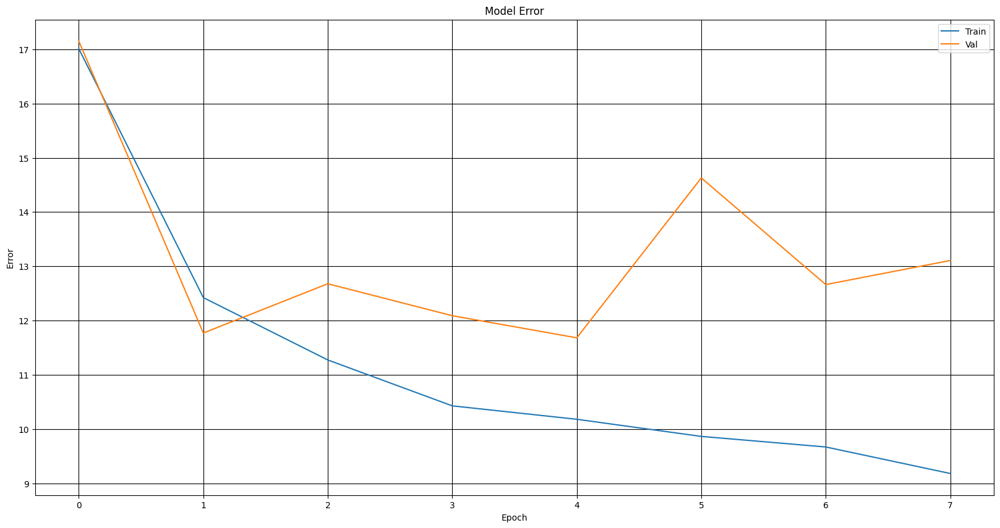

In [ ]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0,
                               patience=5,
                               verbose=0,
                               mode='auto')

# Define the ModelCheckpoint callback
mc = ModelCheckpoint('/content/drive/MyDrive/Farman Project/mobilenet_best_model-100.h5',
                     monitor='val_loss',
                     mode='min',
                     save_best_only=True)

# Define the TensorBoard callback
logdir = os.path.join(logs_dir, datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

# Define the learning rate value
lr = 1e-5

# Define the ReduceLROnPlateau callback
red_lr_plat = ReduceLROnPlateau(monitor='val_loss',
                                factor=0.1,
                                patience=10,
                                verbose=0,
                                mode='auto',
                                min_delta=0.0001,
                                cooldown=0,
                                min_lr=0)

# Create a list of callbacks
callbacks = [tensorboard_callback, early_stopping, mc, red_lr_plat]

# Fit the model to the training data
history = model_mobile_net.fit(train_generator,
                               steps_per_epoch=315,
                               validation_data=val_generator,
                               validation_steps=1,
                               epochs=50,
                               callbacks=callbacks)

# Print the history
print(history)

# Display TensorBoard
%tensorboard --logdir logs

# Plot training and validation error
plot_it(history)

# **inception v3**

In [ ]:
# Define the input shape
input_shape = (img_size, img_size, 3)

# Load the InceptionV3 model with pre-trained weights
base_model = InceptionV3(input_shape=input_shape, include_top=False, weights='imagenet')

# Set the base model to be trainable
base_model.trainable = True

# Create a sequential model
model_inception_v3 = Sequential()

# Add the InceptionV3 base model as the first layer in the model
model_inception_v3.add(base_model)

# Add a global average pooling layer to reduce spatial dimensions
model_inception_v3.add(GlobalAveragePooling2D())

# Add a dense layer with 10 units and ReLU activation
model_inception_v3.add(Dense(25, activation='relu'))

# Add a dense layer with 1 unit and linear activation for regression
model_inception_v3.add(Dense(1, activation='linear'))

# Compile the model with mean squared error (MSE) loss and Adam optimizer
model_inception_v3.compile(loss='mse', optimizer='adam', metrics=[mae_in_months])

# Print a summary of the model architecture
model_inception_v3.summary()

87910968/87910968 [==============================] - 4s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 25)                51225     
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 21,854,035
Trainable params: 21,819,603
Non-trainable params: 34,432
_________________________________________________________________


In [ ]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0,
                               patience=5,
                               verbose=0,
                               mode='auto')

# Define the ModelCheckpoint callback
mc = ModelCheckpoint('/content/drive/MyDrive/Farman Project/inceptionV3_best_model-25.h5',
                     monitor='val_loss',
                     mode='min',
                     save_best_only=True)

# Define the TensorBoard callback
logdir = os.path.join(logs_dir, datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

# Define the learning rate value
lr = 1e-5

# Define the ReduceLROnPlateau callback
red_lr_plat = ReduceLROnPlateau(monitor='val_loss',
                                factor=0.1,
                                patience=10,
                                verbose=0,
                                mode='auto',
                                min_delta=0.0001,
                                cooldown=0,
                                min_lr=0)

# Create a list of callbacks
callbacks = [tensorboard_callback, early_stopping, mc, red_lr_plat]

# Fit the model to the training data
history = model_inception_v3.fit(train_generator,
                                 steps_per_epoch=315,
                                 validation_data=val_generator,
                                 validation_steps=1,
                                 epochs=50,
                                 callbacks=callbacks)

# Print the history
print(history)

# Display TensorBoard
%tensorboard --logdir logs

# Plot training and validation error
plot_it(history)

Epoch 1/50
188/315 [================>.............] - ETA: 45:47 - loss: 0.6767 - mae_in_months: 26.4056

KeyboardInterrupt: ignored

# **evaluation**

44/44 [==============================] - 10s 214ms/step


<ipython-input-35-34db2bb8dc9b>:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ax.set_title('Age: %fY\nPredicted Age: %fY' % (test_months[ind]/12.0, pred[ind]/12.0))


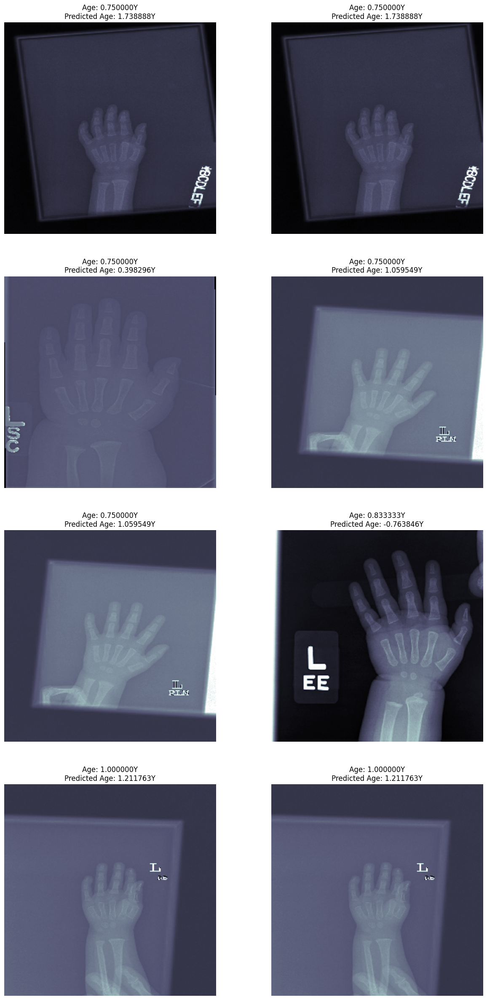

In [ ]:
# Load the weights of the trained model
model_mobile_net.load_weights('/content/drive/MyDrive/Farman Project/mobilenet_best_model-10.h5')

# Predict the bone age for test data using the loaded model
pred = mean_bone_age + std_bone_age*(model_mobile_net.predict(test_X, batch_size = 32, verbose = True))

# Convert the true bone age values to months
test_months = mean_bone_age + std_bone_age*(test_Y)

# Sort the test data indices based on true bone age values
ord_ind = np.argsort(test_Y)

# Select 2000 evenly spaced indices from the sorted list
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 2000).astype(int)] # take 8 evenly spaced ones

# Create a figure with subplots to display the predicted and true bone ages for selected images
fig, axs = plt.subplots(4, 2, figsize = (15, 30))

# Iterate over the selected indices and corresponding subplots
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fY' % (test_months[ind]/12.0, pred[ind]/12.0))
    ax.axis('off')

# Save the figure with predicted and true bone age values as an image
fig.savefig('trained_image_predictions.png', dpi = 300)

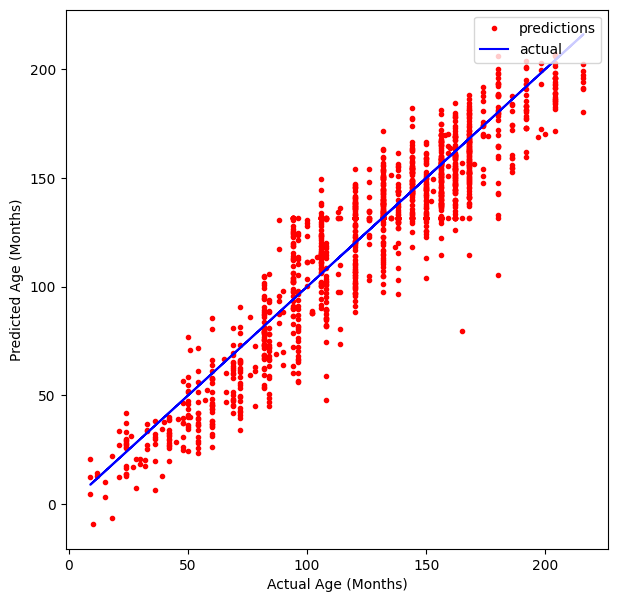

In [ ]:
# Create a figure and axis object with a size of 7x7 inches
fig, ax = plt.subplots(figsize = (7,7))

# Plot the predicted bone ages against the actual bone ages
ax.plot(test_months, pred, 'r.', label = 'predictions')
ax.plot(test_months, test_months, 'b-', label = 'actual')

# Add a legend to the plot indicating the meaning of the plotted elements
ax.legend(loc = 'upper right')

# Set labels for the x-axis and y-axis
ax.set_xlabel('Actual Age (Months)')
ax.set_ylabel('Predicted Age (Months)')

#Show Plot
fig.show()

In [ ]:
# Reset the test generator to its initial state
test_generator.reset()

# Print the information about the test generator
print(test_generator)

# Predict the bone ages using the model on the test generator
y_pred = model_mobile_net.predict(test_generator)

# Flatten the predicted values into a 1D array
predicted = y_pred.flatten()

# Convert the predicted bone ages from normalized values to months
predicted_months = mean_bone_age + std_bone_age * (predicted)

# Get the filenames of the test samples from the test generator
filenames = test_generator.filenames

# Create a DataFrame to store the results with columns for filename and predictions
results = pd.DataFrame({"Filename": filenames, "Predictions": predicted_months})

# Save the results DataFrame to a CSV file named "results.csv"
results.to_csv("results.csv", index=False)

7/7 [==============================] - 44s 7s/step


# **acc**

In [ ]:
results = pd.read_csv("/content/results.csv")
df2 = pd.read_csv("/content/drive/MyDrive/Farman Project/Bone Age Test Set/Bone age ground truth.csv")

# Modify the 'Filename' column in results dataframe
results['Filename'] = results['Filename'].str.replace('Test Set Images/', '').str.replace('.png', '')

# Modify the 'Case ID' column in df2 dataframe
df2['Case ID'] = df2['Case ID'].astype(str)

# Merge the dataframes based on the 'filename' column
merged_df = pd.merge(results, df2, left_on='Filename', right_on='Case ID')

# Select the desired columns from the merged dataframe
desired_columns = ['Filename', 'Predictions', 'Ground truth bone age (months)']
merged_df = merged_df[desired_columns]

# Print the merged dataframe
merged_df.head()

<ipython-input-68-190b60d818f8>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  results['Filename'] = results['Filename'].str.replace('Test Set Images/', '').str.replace('.png', '')


,Filename,Predictions,Ground truth bone age (months)
0,4360,141.86780,168.93
1,4361,173.94300,169.65
2,4362,154.88940,73.26
3,4363,156.17601,152.86
4,4364,201.05164,135.46


In [ ]:
# Read the CSV files
results = pd.read_csv("/content/results.csv")
df2 = pd.read_csv("/content/drive/MyDrive/Farman Project/Bone Age Test Set/Bone age ground truth.csv")

# Convert 'Filename' column in results dataframe to string type
results['Filename'] = results['Filename'].astype(str).str.replace('Test Set Images/', '', regex=False).str.replace('.png', '', regex=False)

# Convert 'Case ID' column in df2 dataframe to string type
df2['Case ID'] = df2['Case ID'].astype(str).str.replace('Test Set Images/', '', regex=False).str.replace('.png', '', regex=False)

# Merge the dataframes based on the modified 'Filename' and 'Case ID' columns
merged_df = pd.merge(results, df2, left_on='Filename', right_on='Case ID')

# Calculate the absolute difference between 'Predictions' and 'Ground truth bone age (months)'
merged_df['result'] = abs(merged_df['Predictions'] - merged_df['Ground truth bone age (months)'])

# Calculate the average of the 'result' column
average_result = merged_df['result'].sum() / len(merged_df)

# Print the result
print("Result:", average_result)

Result: 44.671357
